In [1]:
import os
import pandas as pd
import scanpy as sc

import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..", "utils")))
from analysis_utils import volcano_plot_br, plot_spatial_clusters_per_sample, plot_dotplot_by_treatment

In [2]:
ad = sc.read_h5ad('../data/ST_BRICHOS.h5ad')


In [3]:
ad.obs['barcode'] = list(pd.DataFrame(ad.obs.index)[0].str.split('-P', expand = True)[0])

In [5]:
file

'Anatomical sectioning P28052_202.csv'

In [40]:
import os
import pandas as pd

folder = "../data/anatomical_annotations"
annotated_dfs_L = []
project_names = []
for file in os.listdir(folder):
    if file.endswith(".csv"):
        df = pd.read_csv(os.path.join(folder, file))
        df.columns = [0, 1]  # Rename columns to 0 (barcode), 1 (region)

        # Append sample name to each barcode
        df[0] = df[0].astype(str) + "-" + file.split(' ')[2].split('.')[0]
        df = df.set_index(0)
        annotated_dfs_L.append(df)
    
# Optionally, concatenate all into a single DataFrame
annotated_df = pd.concat(annotated_dfs_L)

In [47]:
annotated_df

,1
0,
AAACAAGTATCTCCCA-1-P28052_202,Corpus Callosum
AAACACCAATAACTGC-1-P28052_202,Cortex Layers 2/3/4
AAACAGCTTTCAGAAG-1-P28052_202,Cortex Layer 1
AAACAGGGTCTATATT-1-P28052_202,Cortex Layers 2/3/4
AAACAGTGTTCCTGGG-1-P28052_202,Optical Region
...,...
TTGTTCAGTGTGCTAC-1-P28052_203,Putamen
TTGTTGTGTGTCAAGA-1-P28052_203,Putamen
TTGTTTCATTAGTCTA-1-P28052_203,Ophtalmic region


In [44]:
mapper = dict(zip(df.index, df[1]))

In [49]:
ad.obs.

,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres,sample,sample_id,n_genes,leiden,treatment,barcode,barcode_sample,region_annotation
AAACAAGTATCTCCCA-1-P24215_301,1,50,102,28217,34029,P24215_301,P24215_301,5333,7,BRICHOS,AAACAAGTATCTCCCA-1,AAACAAGTATCTCCCA-1-P24215_301,NaN
AAACAGAGCGACTCCT-1-P24215_301,1,14,94,10018,31732,P24215_301,P24215_301,3317,2,BRICHOS,AAACAGAGCGACTCCT-1,AAACAGAGCGACTCCT-1-P24215_301,NaN
AAACCGGGTAGGTACC-1-P24215_301,1,42,28,24142,12539,P24215_301,P24215_301,4982,5,BRICHOS,AAACCGGGTAGGTACC-1,AAACCGGGTAGGTACC-1-P24215_301,NaN
AAACCGTTCGTCCAGG-1-P24215_301,1,52,42,29202,16598,P24215_301,P24215_301,6046,0,BRICHOS,AAACCGTTCGTCCAGG-1,AAACCGTTCGTCCAGG-1-P24215_301,NaN
AAACCTCATGAAGTTG-1-P24215_301,1,37,19,21611,9928,P24215_301,P24215_301,6179,5,BRICHOS,AAACCTCATGAAGTTG-1,AAACCTCATGAAGTTG-1-P24215_301,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCAGTGTGCTAC-1-P28052_203,1,24,64,15524,23040,P28052_203,P28052_203,7233,4,PBS,TTGTTCAGTGTGCTAC-1,TTGTTCAGTGTGCTAC-1-P28052_203,Putamen
TTGTTGTGTGTCAAGA-1-P28052_203,1,31,77,19072,26813,P28052_203,P28052_203,7315,4,PBS,TTGTTGTGTGTCAAGA-1,TTGTTGTGTGTCAAGA-1-P28052_203,Putamen
TTGTTTCATTAGTCTA-1-P28052_203,1,60,30,33717,13124,P28052_203,P28052_203,6504,2,PBS,TTGTTTCATTAGTCTA-1,TTGTTTCATTAGTCTA-1-P28052_203,Ophtalmic region
TTGTTTCCATACAACT-1-P28052_203,1,45,27,26128,12265,P28052_203,P28052_203,5322,2,PBS,TTGTTTCCATACAACT-1,TTGTTTCCATACAACT-1-P28052_203,Ophtalmic region


In [51]:
# Map to region
ad.obs["region_annotation"] = ad.obs.index.map(annotated_df[1])

# Optional: check how many barcodes matched
matched = ad.obs["region_annotation"].notna().sum()
print(f"✅ Mapped region annotation to {matched} spots")

✅ Mapped region annotation to 17613 spots


In [52]:
ad.obs

,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres,sample,sample_id,n_genes,leiden,treatment,barcode,barcode_sample,region_annotation
AAACAAGTATCTCCCA-1-P24215_301,1,50,102,28217,34029,P24215_301,P24215_301,5333,7,BRICHOS,AAACAAGTATCTCCCA-1,AAACAAGTATCTCCCA-1-P24215_301,NaN
AAACAGAGCGACTCCT-1-P24215_301,1,14,94,10018,31732,P24215_301,P24215_301,3317,2,BRICHOS,AAACAGAGCGACTCCT-1,AAACAGAGCGACTCCT-1-P24215_301,NaN
AAACCGGGTAGGTACC-1-P24215_301,1,42,28,24142,12539,P24215_301,P24215_301,4982,5,BRICHOS,AAACCGGGTAGGTACC-1,AAACCGGGTAGGTACC-1-P24215_301,NaN
AAACCGTTCGTCCAGG-1-P24215_301,1,52,42,29202,16598,P24215_301,P24215_301,6046,0,BRICHOS,AAACCGTTCGTCCAGG-1,AAACCGTTCGTCCAGG-1-P24215_301,NaN
AAACCTCATGAAGTTG-1-P24215_301,1,37,19,21611,9928,P24215_301,P24215_301,6179,5,BRICHOS,AAACCTCATGAAGTTG-1,AAACCTCATGAAGTTG-1-P24215_301,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCAGTGTGCTAC-1-P28052_203,1,24,64,15524,23040,P28052_203,P28052_203,7233,4,PBS,TTGTTCAGTGTGCTAC-1,TTGTTCAGTGTGCTAC-1-P28052_203,Putamen
TTGTTGTGTGTCAAGA-1-P28052_203,1,31,77,19072,26813,P28052_203,P28052_203,7315,4,PBS,TTGTTGTGTGTCAAGA-1,TTGTTGTGTGTCAAGA-1-P28052_203,Putamen
TTGTTTCATTAGTCTA-1-P28052_203,1,60,30,33717,13124,P28052_203,P28052_203,6504,2,PBS,TTGTTTCATTAGTCTA-1,TTGTTTCATTAGTCTA-1-P28052_203,Ophtalmic region
TTGTTTCCATACAACT-1-P28052_203,1,45,27,26128,12265,P28052_203,P28052_203,5322,2,PBS,TTGTTTCCATACAACT-1,TTGTTTCCATACAACT-1-P28052_203,Ophtalmic region


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


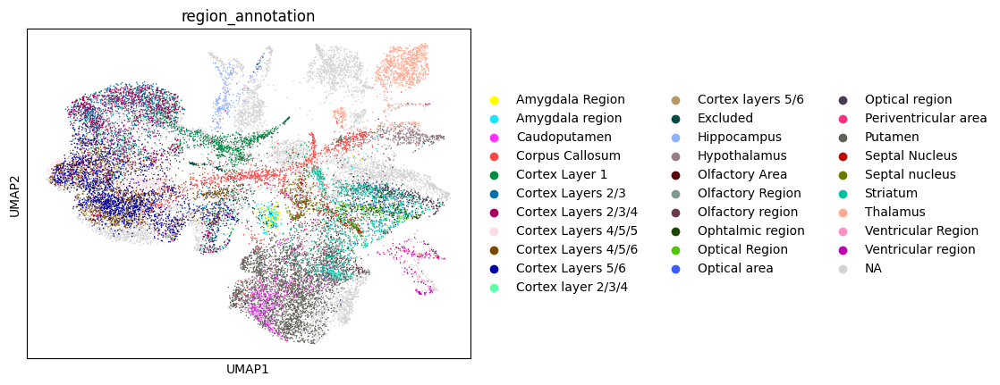

In [53]:
sc.pl.umap(ad, color = 'region_annotation')

📍 Plotting sample: P24215_301


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


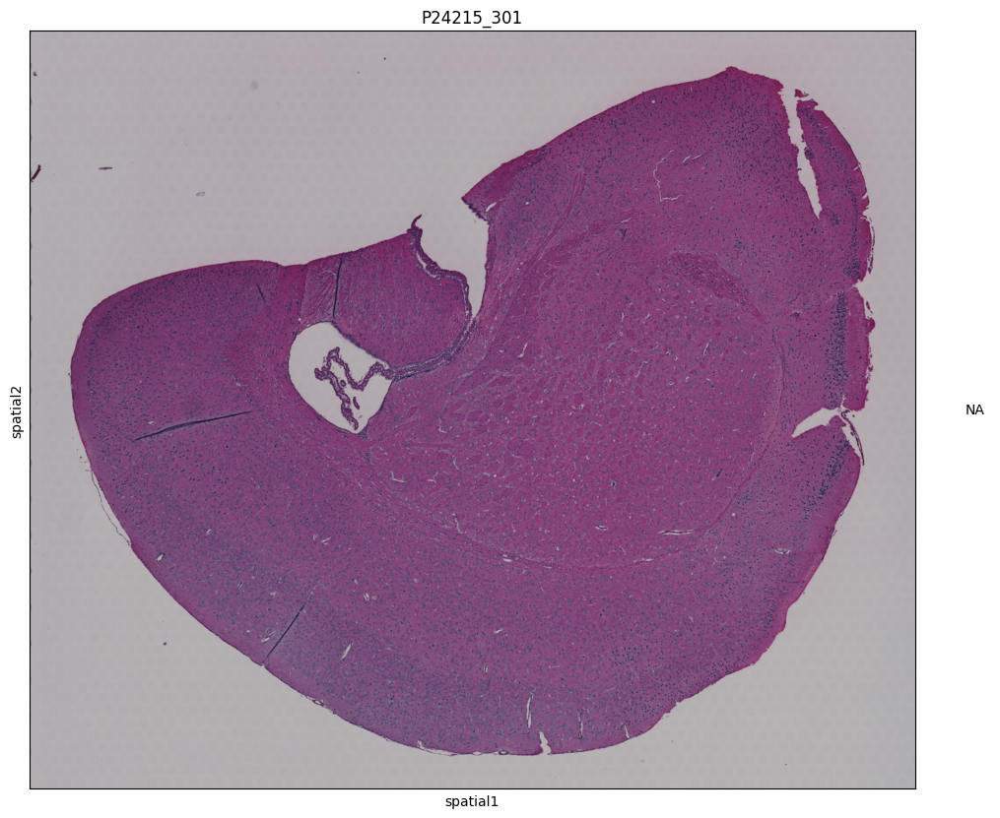

📍 Plotting sample: P28052_201


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


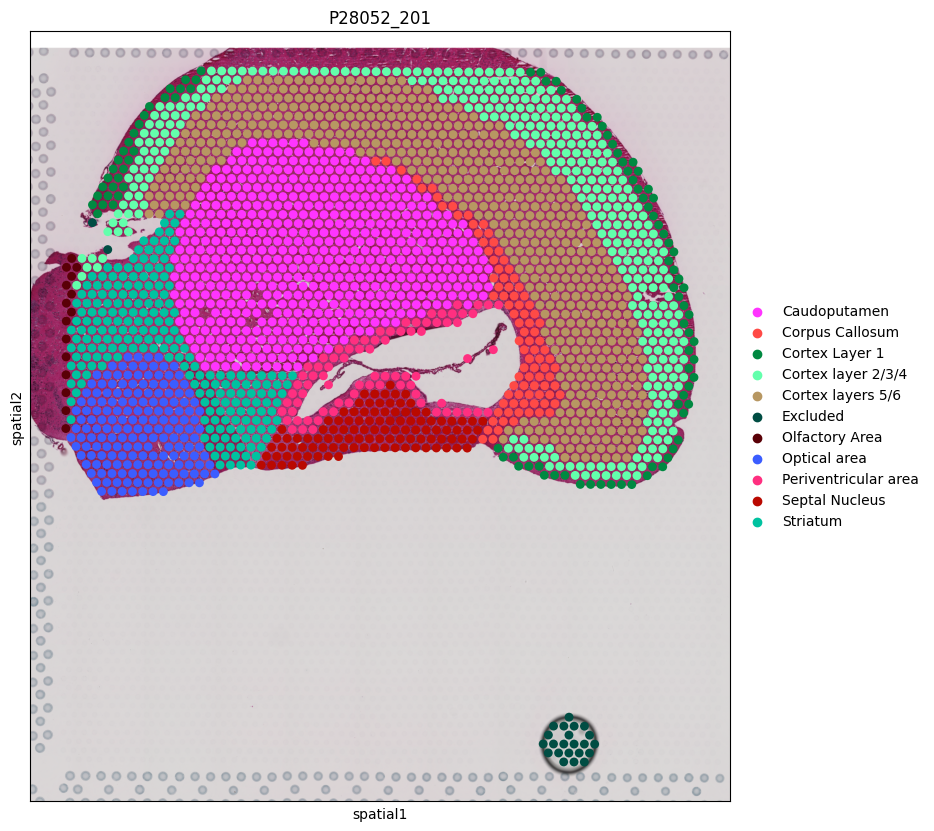

📍 Plotting sample: P24215_101


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


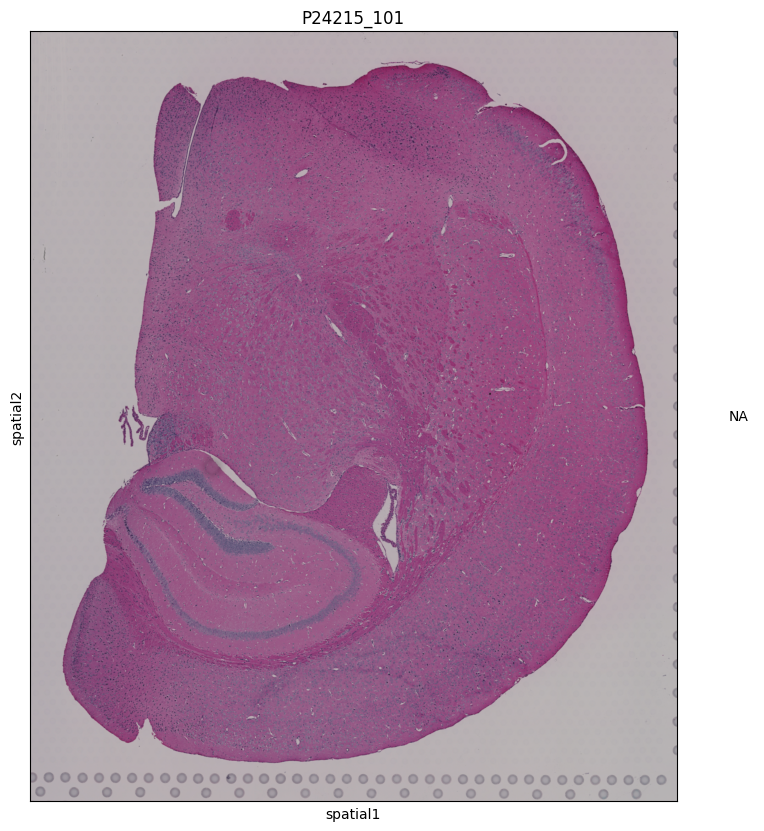

📍 Plotting sample: P28052_103


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


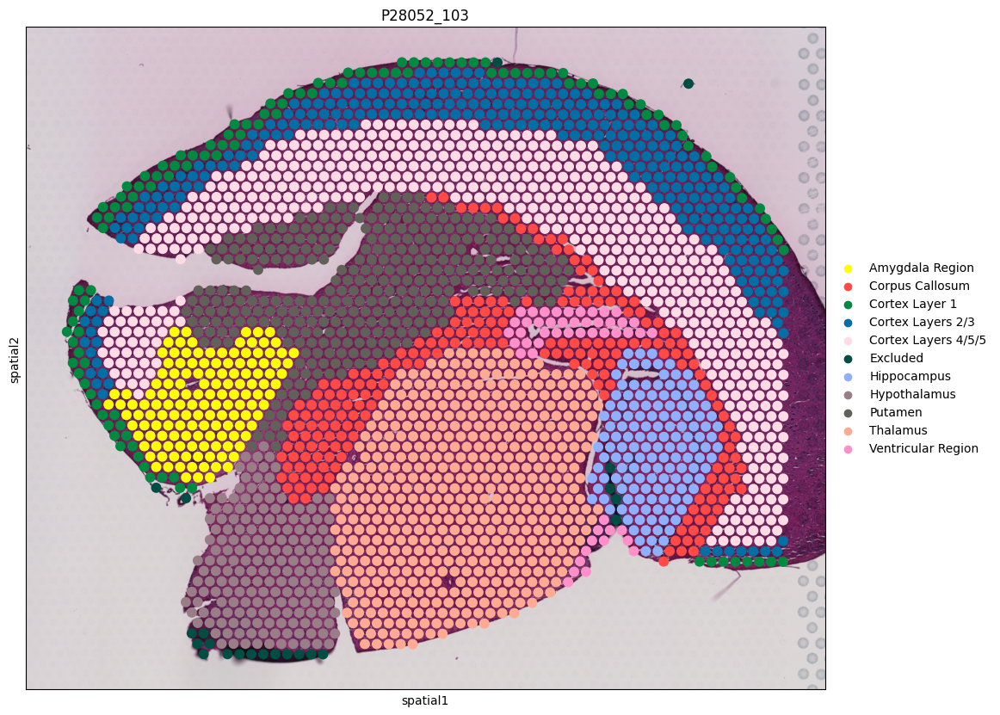

📍 Plotting sample: P28052_102


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


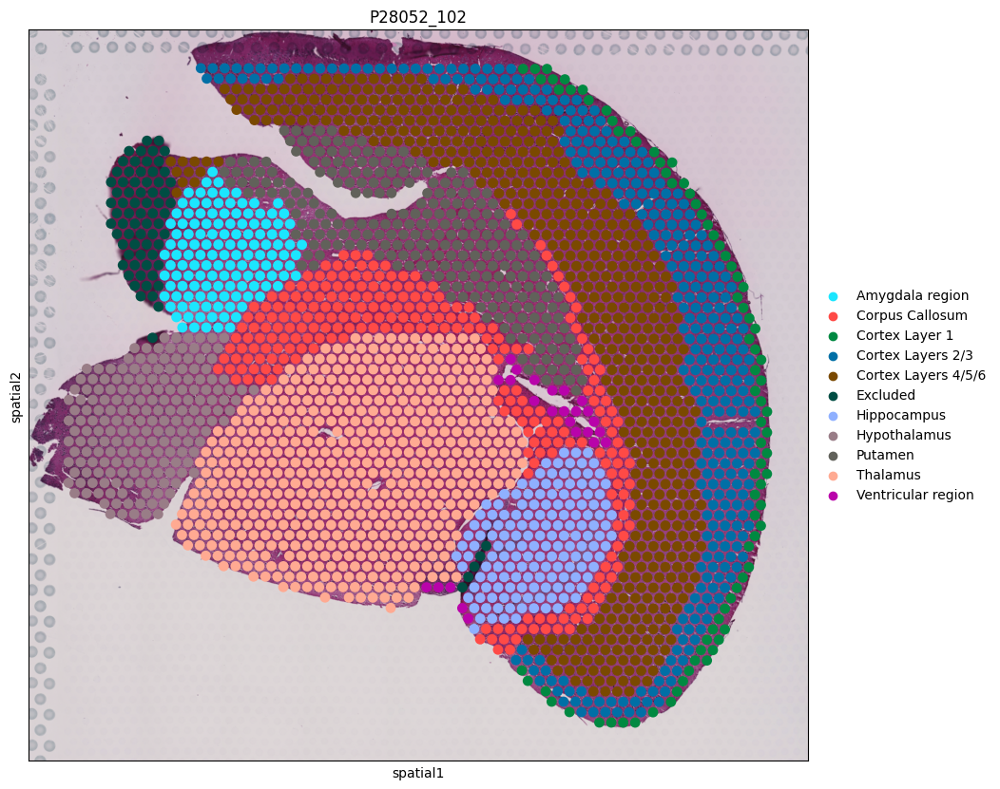

📍 Plotting sample: P28052_401


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


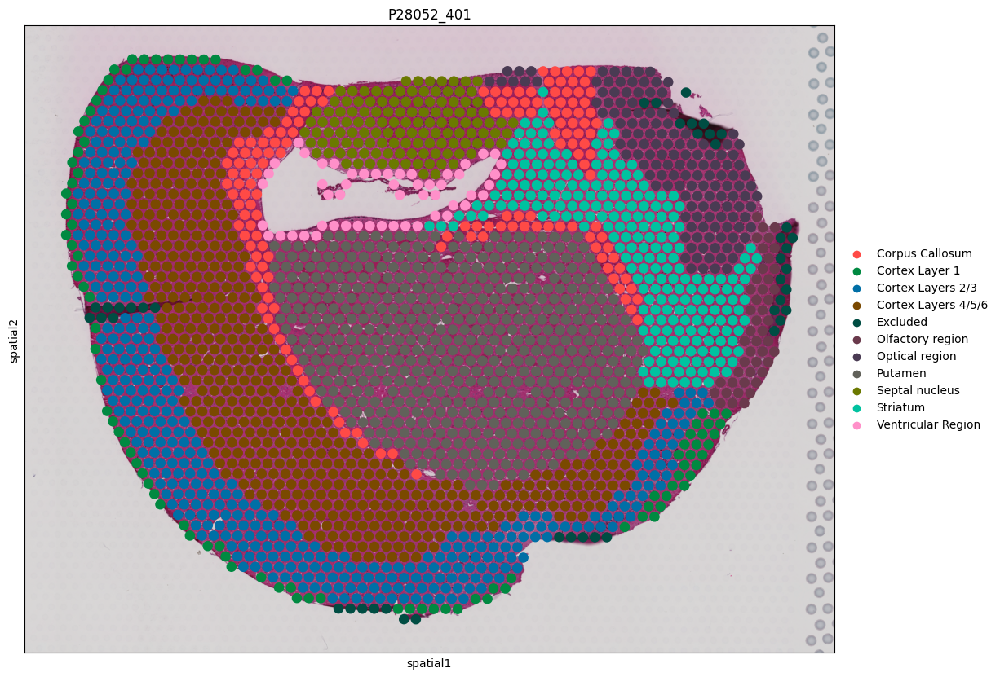

📍 Plotting sample: P24215_201


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


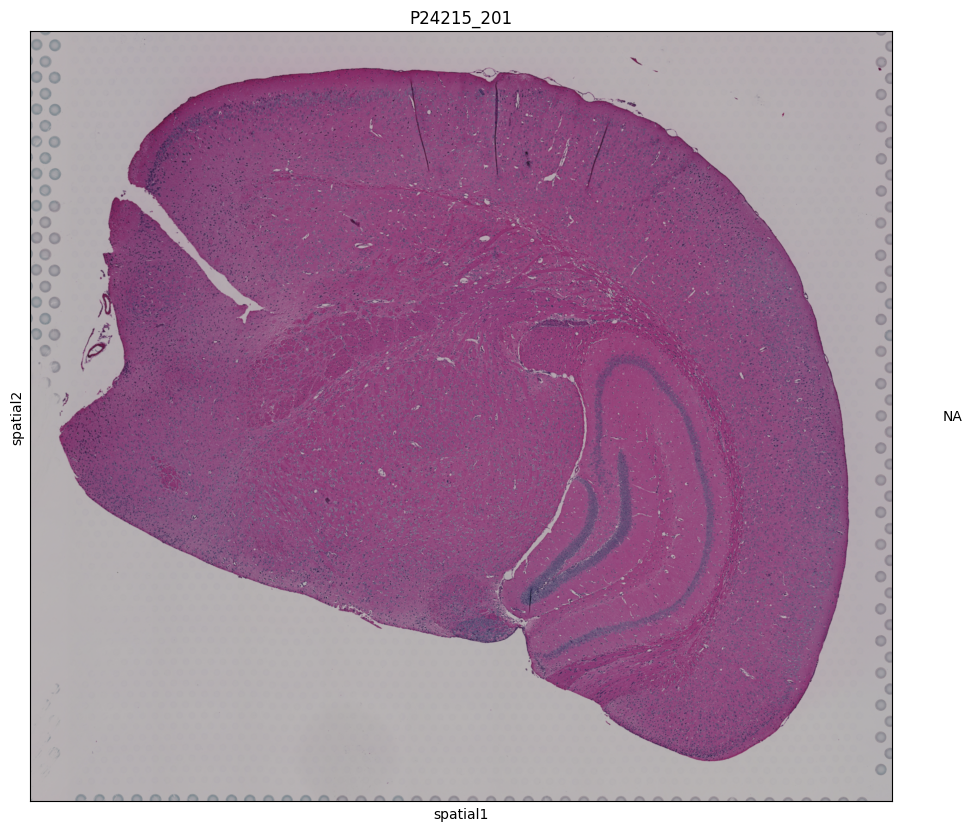

📍 Plotting sample: P28052_301


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


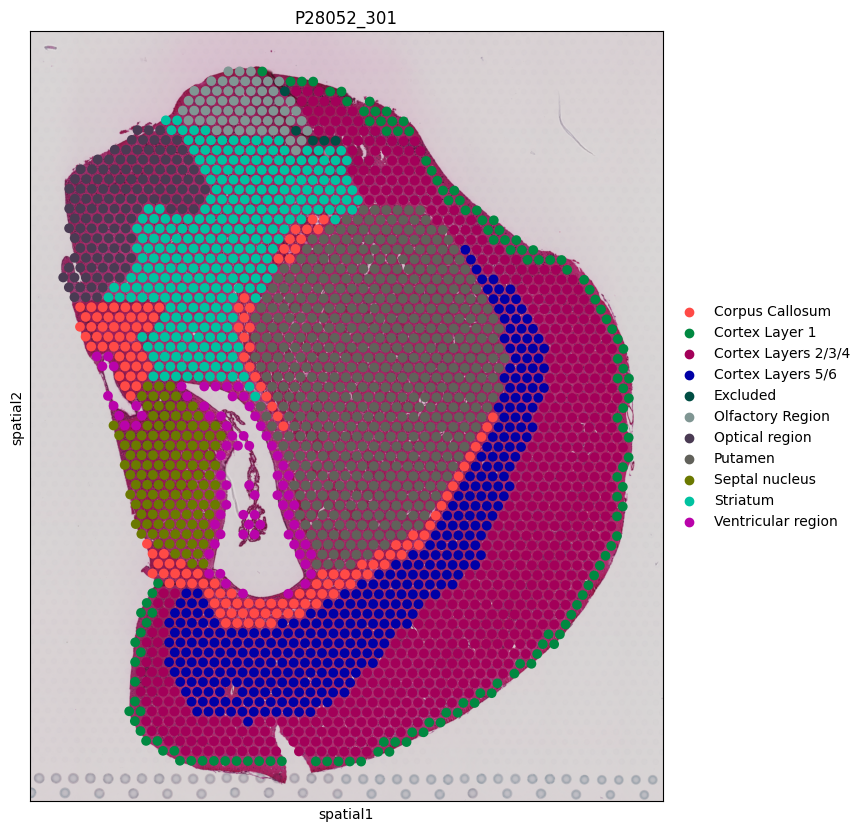

📍 Plotting sample: P28052_202


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


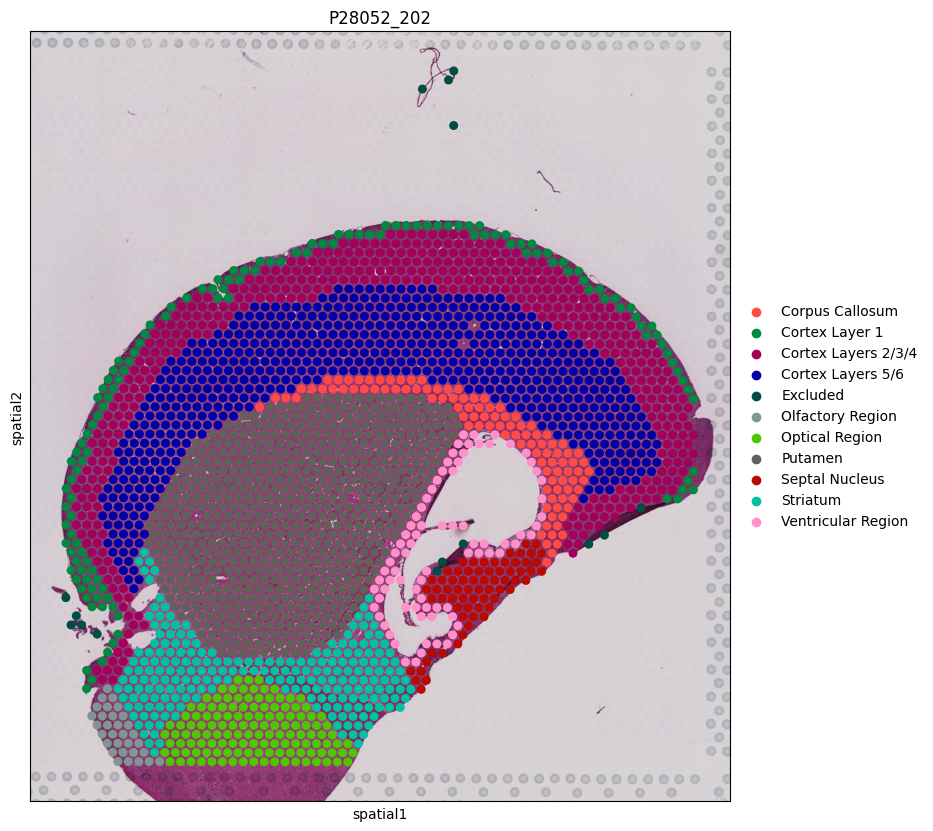

📍 Plotting sample: P28052_203


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


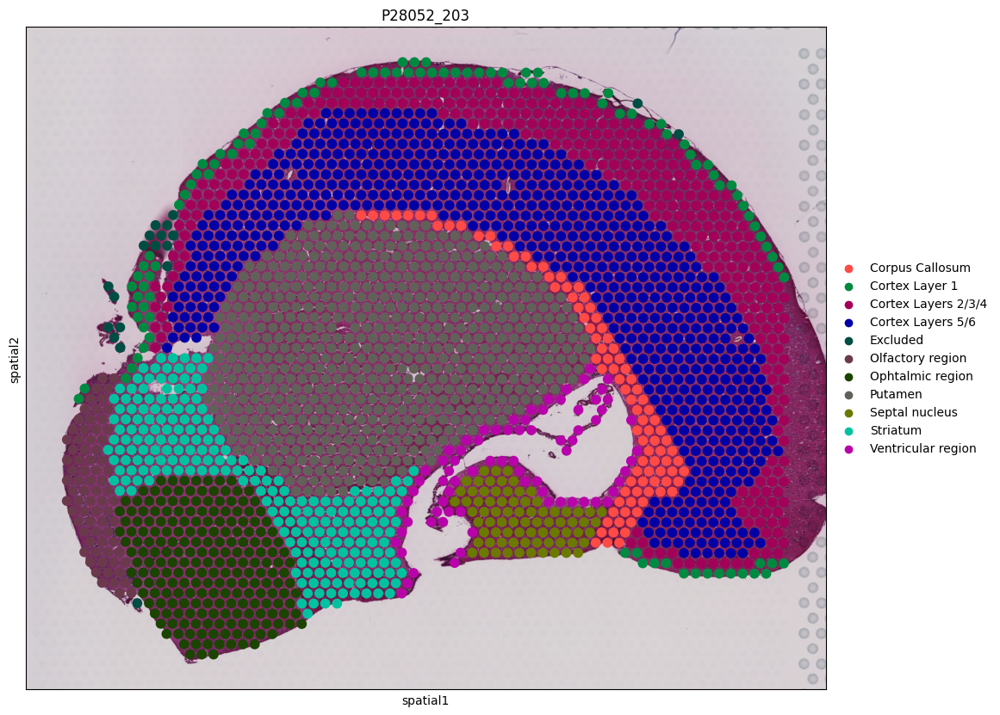

In [54]:
plot_spatial_clusters_per_sample(ad, color='region_annotation')